# Building Models and Data Analysis
### Now we begin testing on the various variables identified in Data_EDA.ipynb

In [14]:
#Import of Basic Libraries
#Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import io
sb.set()

In [15]:
# Importing essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix

In [16]:
movieDB = pd.read_csv('Data_Cleaning/allCleanedMovieData.csv')
movieDB = movieDB[['id','original_title','budget','revenue','release_date','popularity.1','vote_average','runtime','top_casts_popularity_avg','casts_popularity_sum','top_cast_popularity','top_crews_popularity_avg','crews_popularity_sum','top_crew_popularity','percentage_revenue','Won']]
movieDB.rename(columns={'popularity.1':'popularity', 'Won':'won'}, inplace=True)
movieDB.head()

,id,original_title,budget,revenue,release_date,popularity,vote_average,runtime,top_casts_popularity_avg,casts_popularity_sum,top_cast_popularity,top_crews_popularity_avg,crews_popularity_sum,top_crew_popularity,percentage_revenue,won
0,5,Four Rooms,4000000.0,4257354.0,1995.0,22.784,5.744,98.0,32.033857,362.055,36.681,15.715714,225.920,27.939,106.43,False
1,6,Judgment Night,21000000.0,12136938.0,1993.0,11.530,6.543,109.0,14.834857,124.008,23.049,3.600143,32.165,5.436,57.79,False
2,11,Star Wars,11000000.0,775398007.0,1977.0,86.624,8.207,121.0,17.367714,297.868,37.206,7.543000,121.872,10.994,7049.07,True
3,12,Finding Nemo,94000000.0,940335536.0,2003.0,99.340,7.824,100.0,23.006429,467.094,41.251,8.758000,404.117,14.186,1000.36,True
4,13,Forrest Gump,55000000.0,677387716.0,1994.0,68.192,8.481,142.0,32.837571,526.057,99.618,6.422000,224.432,11.735,1231.61,True


# Creating all the separate DataFrames

In [17]:
won = pd.DataFrame(movieDB['won'])
runtime = pd.DataFrame(movieDB['runtime'])
castSum = pd.DataFrame(movieDB['casts_popularity_sum'])
crewSum = pd.DataFrame(movieDB['crews_popularity_sum'])
voteAvg = pd.DataFrame(movieDB['vote_average'])
percRev = pd.DataFrame(movieDB['percentage_revenue'])


# Creating the Test and Train Sets for decision tree generation later

In [18]:
# Splitting the dataset into the Training set and Test set
# 80% of the data will be used for training and 20% for test based on runtime
won_train, won_test, runtime_train, runtime_test = train_test_split(won, runtime, test_size = 0.2, random_state=50)
print("Runtime Set")
print("Train Set :", won_train.shape, runtime_train.shape)
print("Test Set  :", won_test.shape, runtime_test.shape)

# Based on castSum
won_castSum_train, won_castSum_test, castSum_train, castSum_test = train_test_split(won, castSum, test_size = 0.2, random_state=50)
print("Cast Set")
print("Train Set :", won_castSum_train.shape, castSum_train.shape)
print("Test Set  :", won_castSum_test.shape, castSum_test.shape)

# Based on crewSum
won_crewSum_train, won_crewSum_test, crewSum_train, crewSum_test = train_test_split(won, crewSum, test_size = 0.2, random_state=50)
print("Crew Set")
print("Train Set :", won_crewSum_train.shape, crewSum_train.shape)
print("Test Set  :", won_crewSum_test.shape, crewSum_test.shape)

# Based on voteAvg
won_voteAge_train, won_voteAge_test, voteAvg_train, voteAvg_test = train_test_split(won, voteAvg, test_size = 0.2, random_state=50)
print("Vote Avg Set")
print("Train Set :", won_voteAge_train.shape, voteAvg_train.shape)
print("Test Set  :", won_voteAge_test.shape, voteAvg_test.shape)

# Based on percRev (is using 6 as 5 used for multiVar and this was later added)
won_percRev_train, won_percRev_test, percRev_train, percRev_test = train_test_split(won, percRev, test_size = 0.2, random_state=50)
print("Percentage Revenue Set")
print("Train Set :", won_percRev_train.shape, percRev_train.shape)
print("Test Set  :", won_percRev_test.shape, percRev_test.shape)

Runtime Set
Train Set : (7689, 1) (7689, 1)
Test Set  : (1923, 1) (1923, 1)
Cast Set
Train Set : (7689, 1) (7689, 1)
Test Set  : (1923, 1) (1923, 1)
Crew Set
Train Set : (7689, 1) (7689, 1)
Test Set  : (1923, 1) (1923, 1)
Vote Avg Set
Train Set : (7689, 1) (7689, 1)
Test Set  : (1923, 1) (1923, 1)
Percentage Revenue Set
Train Set : (7689, 1) (7689, 1)
Test Set  : (1923, 1) (1923, 1)


In [19]:
#function to print TPR, FPR ETC
def binary_metric(y_true, y_pred):
    CM = confusion_matrix(y_true, y_pred)
    TN = CM[0][0]
    FN = CM[1][0]
    TP = CM[1][1]
    FP = CM[0][1]
    TPR = TP / (TP + FN)
    FPR = FP / (FP + TN)
    return TPR, FPR
    

## Runtime 

<Axes: >

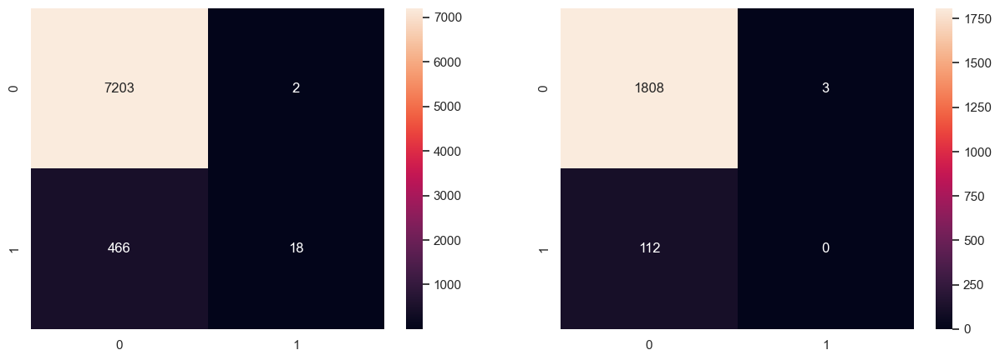

In [20]:
# Decision Tree
dectree_runtime = DecisionTreeClassifier(max_depth = 20)
dectree_runtime.fit(runtime_train, won_train)

# Predicting the Test set results
runtime_train_pred = dectree_runtime.predict(runtime_train)
runtime_test_pred = dectree_runtime.predict(runtime_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_train, runtime_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_test, runtime_test_pred), annot = True, fmt = "d", ax = ax[1])

In [21]:
# Classificiation Accuracy for Runtime of movie

TPRTrain, FPRTrain = binary_metric(won_train, runtime_train_pred)
TPRTest, FPRTest = binary_metric(won_test, runtime_test_pred)
print("Variable: Runtime")
print("Classification Accuracy for train data:\t", dectree_runtime.score(runtime_train, won_train))
print("Classification Accuracy for test data:\t", dectree_runtime.score(runtime_test, won_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)


Variable: Runtime
Classification Accuracy for train data:	 0.9391338275458447
Classification Accuracy for test data:	 0.9401976079043162
TPR for train:	 0.0371900826446281
FPR for train:	 0.0002775850104094379
TPR for test:	 0.0
FPR for train:	 0.0016565433462175593


[Text(0.3986782962328767, 0.9666666666666667, 'runtime <= 117.5\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.17915239726027396, 0.9, 'runtime <= 107.5\ngini = 0.066\nsamples = 5831\nvalue = [5632, 199]\nclass = Won'),
 Text(0.11001712328767123, 0.8333333333333334, 'runtime <= 98.5\ngini = 0.047\nsamples = 4568\nvalue = [4458, 110]\nclass = Won'),
 Text(0.038527397260273974, 0.7666666666666667, 'runtime <= 27.5\ngini = 0.033\nsamples = 2910\nvalue = [2861, 49]\nclass = Won'),
 Text(0.0136986301369863, 0.7, 'runtime <= 26.5\ngini = 0.124\nsamples = 15\nvalue = [14, 1]\nclass = Won'),
 Text(0.00684931506849315, 0.6333333333333333, 'gini = 0.0\nsamples = 13\nvalue = [13, 0]\nclass = Won'),
 Text(0.02054794520547945, 0.6333333333333333, 'gini = 0.5\nsamples = 2\nvalue = [1, 1]\nclass = Won'),
 Text(0.06335616438356165, 0.7, 'runtime <= 85.5\ngini = 0.033\nsamples = 2895\nvalue = [2847, 48]\nclass = Won'),
 Text(0.03424657534246575, 0.6333333333333333, 'runtime 

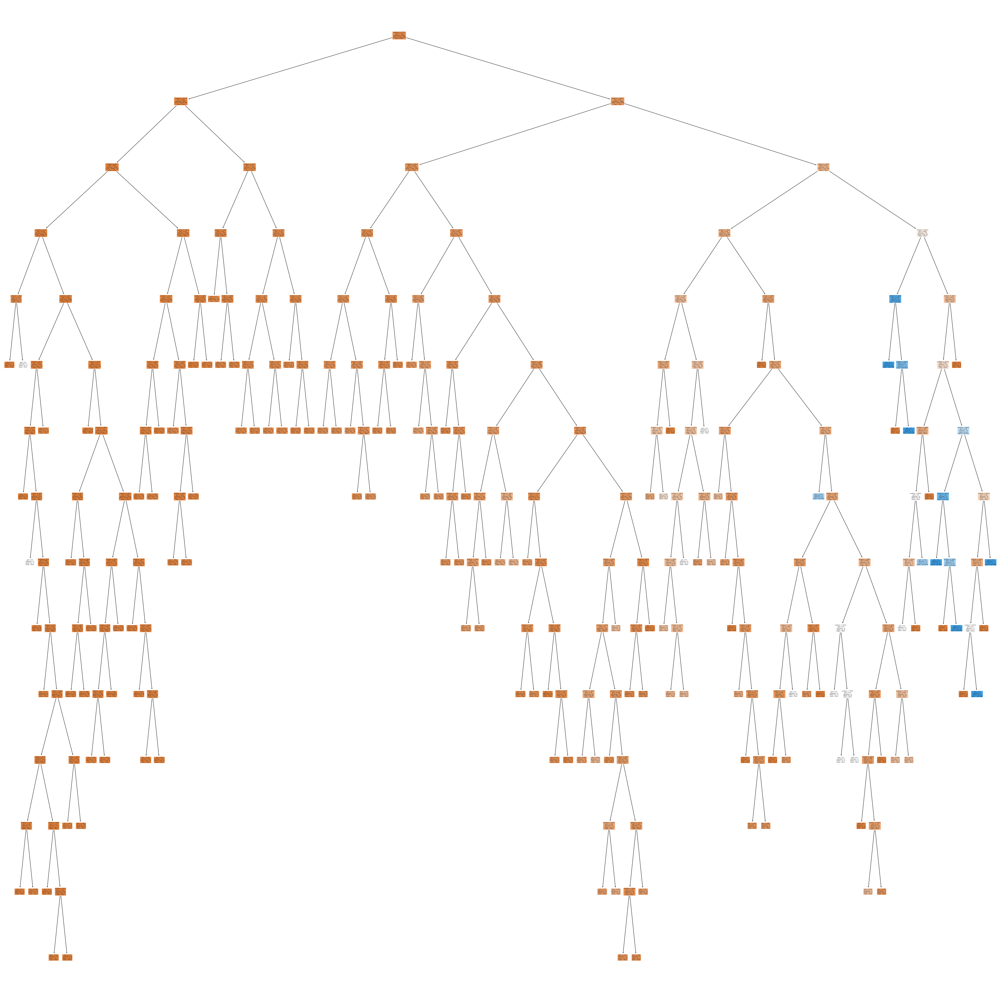

In [22]:
# Printing decision Tree
f = plt.figure(figsize=(50,50))
plot_tree(dectree_runtime, filled = True, rounded = True, class_names = ["Won", "Not Won"], feature_names = ["runtime"])

## CastSum

<Axes: >

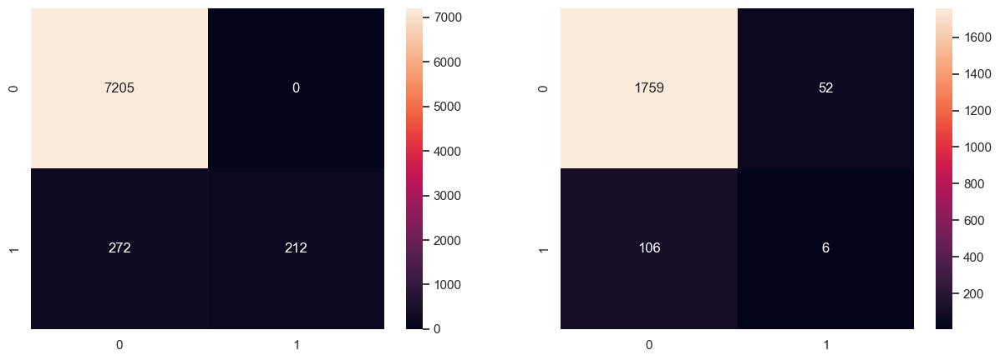

In [23]:
# Decision Tree for castSum
dectree_castSum = DecisionTreeClassifier(max_depth = 20)
dectree_castSum.fit(castSum_train, won_castSum_train)

# Predicting the Test set results
castSum_train_pred = dectree_castSum.predict(castSum_train)
castSum_test_pred = dectree_castSum.predict(castSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_castSum_train, castSum_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_castSum_test, castSum_test_pred), annot = True, fmt = "d", ax = ax[1])

In [24]:
TPRTrain, FPRTrain = binary_metric(won_castSum_train, castSum_train_pred)
TPRTest, FPRTest = binary_metric(won_castSum_test, castSum_test_pred)
print("Variable: Cast Summary")
print("Classification Accuracy for train data:\t", dectree_castSum.score(castSum_train, won_castSum_train))
print("Classification Accuracy for test data:\t", dectree_castSum.score(castSum_test, won_castSum_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)


Variable: Cast Summary
Classification Accuracy for train data:	 0.9646247886591234
Classification Accuracy for test data:	 0.9178367134685388
TPR for train:	 0.4380165289256198
FPR for train:	 0.0
TPR for test:	 0.05357142857142857
FPR for train:	 0.02871341800110436


[Text(0.4210111516568981, 0.9761904761904762, 'castSum <= 301.495\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.15700201476555456, 0.9285714285714286, 'castSum <= 66.594\ngini = 0.101\nsamples = 6489\nvalue = [6142, 347]\nclass = Won'),
 Text(0.07146077547339946, 0.8809523809523809, 'castSum <= 35.179\ngini = 0.052\nsamples = 1243\nvalue = [1210, 33]\nclass = Won'),
 Text(0.034265103697024346, 0.8333333333333334, 'castSum <= 28.507\ngini = 0.032\nsamples = 434\nvalue = [427, 7]\nclass = Won'),
 Text(0.030658250676284943, 0.7857142857142857, 'castSum <= 28.483\ngini = 0.042\nsamples = 326\nvalue = [319, 7]\nclass = Won'),
 Text(0.027051397655545536, 0.7380952380952381, 'castSum <= 27.785\ngini = 0.036\nsamples = 325\nvalue = [319, 6]\nclass = Won'),
 Text(0.018034265103697024, 0.6904761904761905, 'castSum <= 13.137\ngini = 0.031\nsamples = 314\nvalue = [309, 5]\nclass = Won'),
 Text(0.010820559062218215, 0.6428571428571429, 'castSum <= 13.043\ngini = 0.065\n

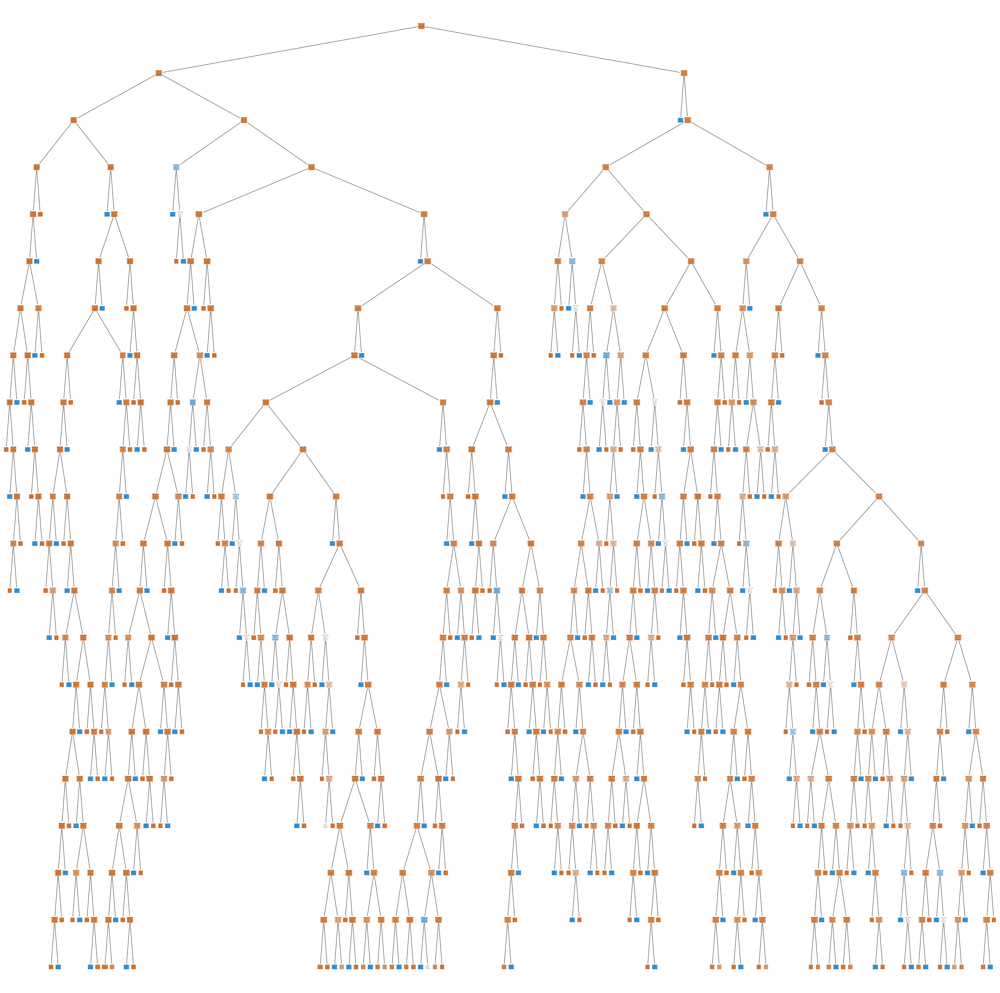

In [25]:
# Printing decision Tree
f = plt.figure(figsize=(50,50))
plot_tree(dectree_castSum, filled = True, rounded = True, class_names = ["Won", "Not Won"], feature_names = ["castSum"])

## CrewSum

<Axes: >

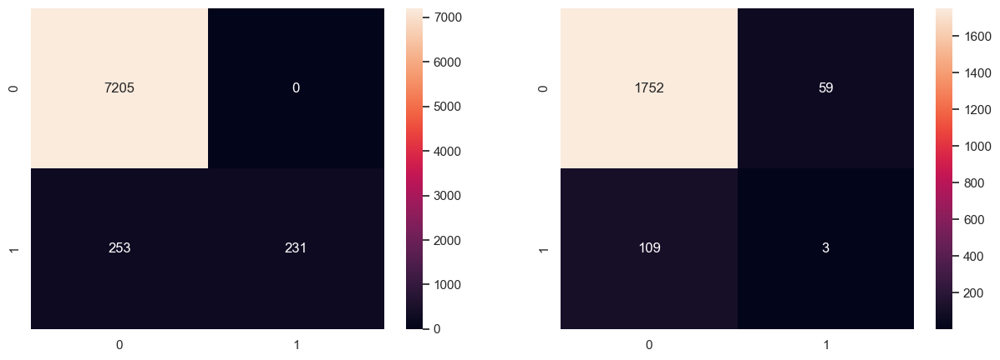

In [26]:
# Decision Tree for crewSum
dectree_crewSum = DecisionTreeClassifier(max_depth = 20)
dectree_crewSum.fit(crewSum_train, won_crewSum_train)

# Predicting the Test set results
crewSum_train_pred = dectree_crewSum.predict(crewSum_train)
crewSum_test_pred = dectree_crewSum.predict(crewSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_crewSum_train, crewSum_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_crewSum_test, crewSum_test_pred), annot = True, fmt = "d", ax = ax[1])

In [27]:
TPRTrain, FPRTrain = binary_metric(won_crewSum_train, crewSum_train_pred)
TPRTest, FPRTest = binary_metric(won_crewSum_test, crewSum_test_pred)
print("Variable: CrewSum")
print("Classification Accuracy for train data:\t", dectree_crewSum.score(crewSum_train, won_crewSum_train))
print("Classification Accuracy for test data:\t", dectree_crewSum.score(crewSum_test, won_crewSum_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)

Variable: CrewSum
Classification Accuracy for train data:	 0.9670958512160229
Classification Accuracy for test data:	 0.9126365054602185
TPR for train:	 0.4772727272727273
FPR for train:	 0.0
TPR for test:	 0.026785714285714284
FPR for train:	 0.03257868580894534


[Text(0.551211052378055, 0.9761904761904762, 'crewSum <= 201.597\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.2361813583815029, 0.9285714285714286, 'crewSum <= 21.339\ngini = 0.107\nsamples = 7150\nvalue = [6746, 404]\nclass = Won'),
 Text(0.018659365175945644, 0.8809523809523809, 'crewSum <= 11.484\ngini = 0.03\nsamples = 1232\nvalue = [1213, 19]\nclass = Won'),
 Text(0.015414258188824663, 0.8333333333333334, 'gini = 0.0\nsamples = 445\nvalue = [445, 0]\nclass = Won'),
 Text(0.021904472163066627, 0.8333333333333334, 'crewSum <= 11.486\ngini = 0.047\nsamples = 787\nvalue = [768, 19]\nclass = Won'),
 Text(0.018659365175945644, 0.7857142857142857, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = Not Won'),
 Text(0.025149579150187607, 0.7857142857142857, 'crewSum <= 11.562\ngini = 0.045\nsamples = 786\nvalue = [768, 18]\nclass = Won'),
 Text(0.009735320961362945, 0.7380952380952381, 'crewSum <= 11.556\ngini = 0.219\nsamples = 8\nvalue = [7, 1]\nclass = Won')

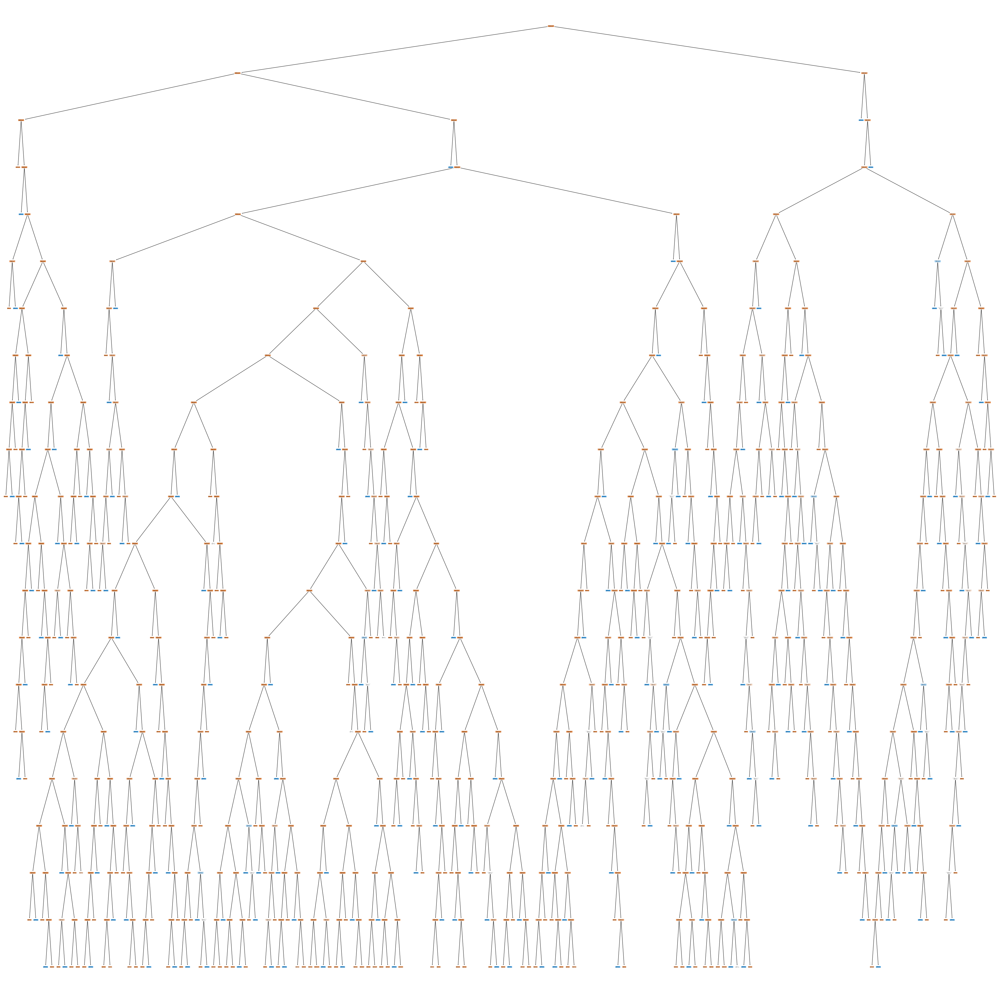

In [28]:
# Printing decision Tree
f = plt.figure(figsize=(50,50))
plot_tree(dectree_crewSum, filled = True, rounded = True, class_names = ["Won", "Not Won"], feature_names = ["crewSum"])

## VoteAvg

<Axes: >

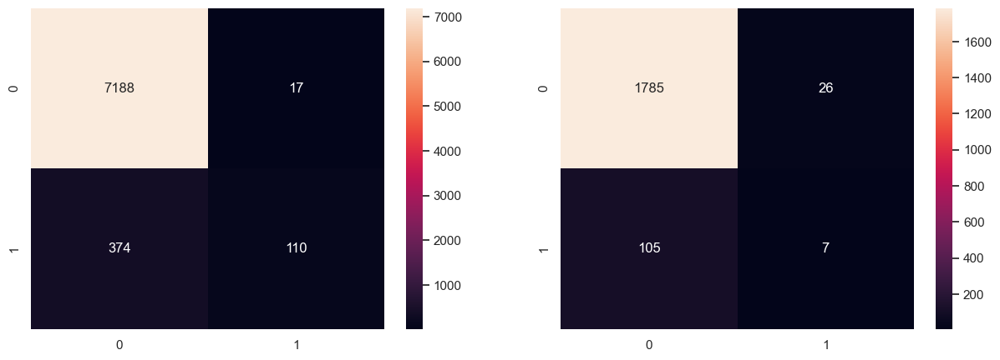

In [29]:
# Decision Tree for voteAvg
dectree_voteAvg = DecisionTreeClassifier(max_depth = 20)
dectree_voteAvg.fit(voteAvg_train, won_voteAge_train)

# Predicting the Test set results
voteAvg_train_pred = dectree_voteAvg.predict(voteAvg_train)
voteAvg_test_pred = dectree_voteAvg.predict(voteAvg_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_voteAge_train, voteAvg_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_voteAge_test, voteAvg_test_pred), annot = True, fmt = "d", ax = ax[1])

In [30]:
TPRTrain, FPRTrain = binary_metric(won_voteAge_train, voteAvg_train_pred)
TPRTest, FPRTest = binary_metric(won_voteAge_test, voteAvg_test_pred)
print("Variable: Vote Average")
print("Classification Accuracy for train data:\t", dectree_voteAvg.score(voteAvg_train, won_voteAge_train))
print("Classification Accuracy for test data:\t", dectree_voteAvg.score(voteAvg_test, won_voteAge_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)

Variable: Vote Average
Classification Accuracy for train data:	 0.94914813369749
Classification Accuracy for test data:	 0.9318772750910036
TPR for train:	 0.22727272727272727
FPR for train:	 0.002359472588480222
TPR for test:	 0.0625
FPR for train:	 0.01435670900055218


[Text(0.4341095258604805, 0.9761904761904762, 'voteAvg <= 7.156\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.18882665094339623, 0.9285714285714286, 'voteAvg <= 6.822\ngini = 0.052\nsamples = 5951\nvalue = [5791, 160]\nclass = Won'),
 Text(0.07923054245283019, 0.8809523809523809, 'voteAvg <= 6.165\ngini = 0.032\nsamples = 4929\nvalue = [4848, 81]\nclass = Won'),
 Text(0.025685436320754717, 0.8333333333333334, 'voteAvg <= 5.539\ngini = 0.013\nsamples = 2659\nvalue = [2642, 17]\nclass = Won'),
 Text(0.017099056603773585, 0.7857142857142857, 'voteAvg <= 4.905\ngini = 0.002\nsamples = 1033\nvalue = [1032, 1]\nclass = Won'),
 Text(0.01474056603773585, 0.7380952380952381, 'voteAvg <= 4.899\ngini = 0.006\nsamples = 310\nvalue = [309, 1]\nclass = Won'),
 Text(0.012382075471698114, 0.6904761904761905, 'gini = 0.0\nsamples = 288\nvalue = [288, 0]\nclass = Won'),
 Text(0.017099056603773585, 0.6904761904761905, 'gini = 0.087\nsamples = 22\nvalue = [21, 1]\nclass = Won'

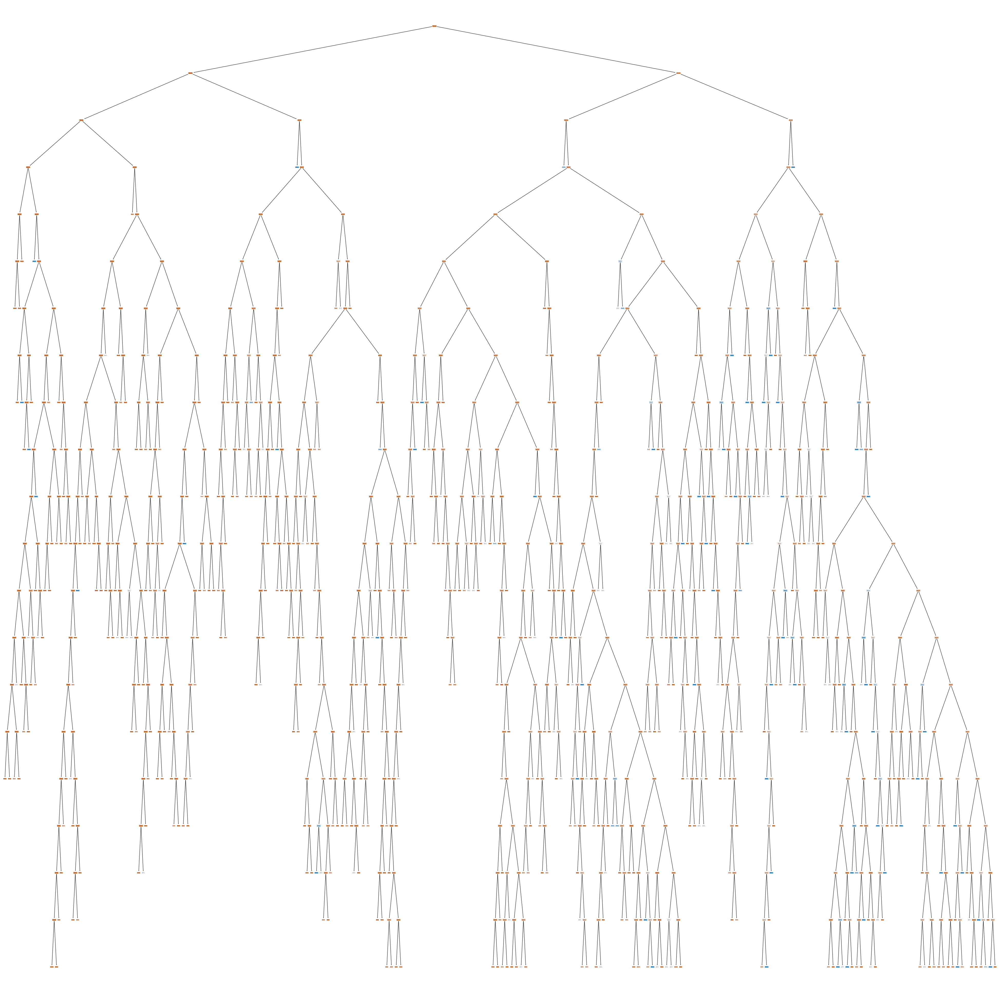

In [31]:
# Printing decision Tree
f = plt.figure(figsize=(50,50))
plot_tree(dectree_voteAvg, filled = True, rounded = True, class_names = ["Won", "Not Won"], feature_names = ["voteAvg"])

### Percentage Revenue Analyst with winning an Oscar Award

<Axes: >

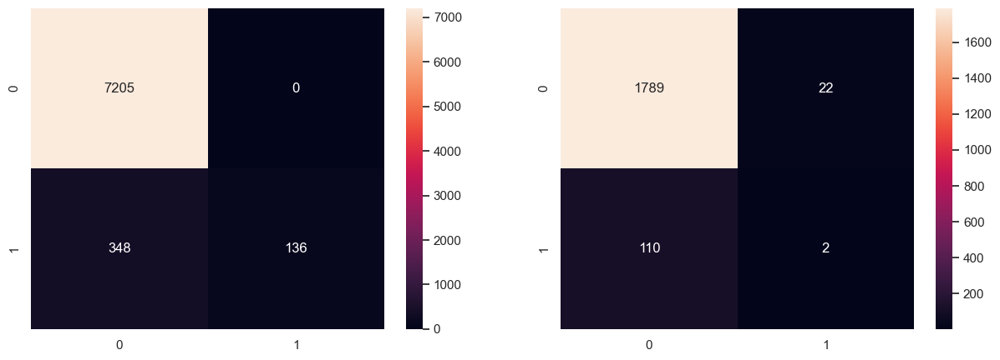

In [32]:
dectree_percRev = DecisionTreeClassifier(max_depth=15)
dectree_percRev.fit(percRev_train, won_percRev_train)

precRev_train_pred = dectree_percRev.predict(percRev_train)
precRev_test_pred = dectree_percRev.predict(percRev_test)

f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_percRev_train, precRev_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_percRev_test, precRev_test_pred), annot = True, fmt = "d", ax = ax[1])

In [33]:
# Classificiation Accuracy for Perv Revenue

TPRTrain, FPRTrain = binary_metric(won_percRev_train, precRev_train_pred)
TPRTest, FPRTest = binary_metric(won_percRev_test, precRev_test_pred)
print("Variable: Percentage Revenue")
print("Classification Accuracy for train data:\t", dectree_percRev.score(percRev_train, won_percRev_train))
print("Classification Accuracy for test data:\t", dectree_percRev.score(percRev_test, won_percRev_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)

Variable: Percentage Revenue
Classification Accuracy for train data:	 0.9547405384315255
Classification Accuracy for test data:	 0.9313572542901716
TPR for train:	 0.2809917355371901
FPR for train:	 0.0
TPR for test:	 0.017857142857142856
FPR for train:	 0.012147984538928768


[Text(0.47483955659276544, 0.96875, 'percentage_revenue <= 366.865\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.1782380396732789, 0.90625, 'percentage_revenue <= 206.735\ngini = 0.063\nsamples = 6198\nvalue = [5995, 203]\nclass = Won'),
 Text(0.08751458576429405, 0.84375, 'percentage_revenue <= 63.875\ngini = 0.05\nsamples = 5148\nvalue = [5015, 133]\nclass = Won'),
 Text(0.051341890315052506, 0.78125, 'percentage_revenue <= 32.725\ngini = 0.024\nsamples = 1004\nvalue = [992, 12]\nclass = Won'),
 Text(0.03267211201866978, 0.71875, 'percentage_revenue <= 32.695\ngini = 0.033\nsamples = 593\nvalue = [583, 10]\nclass = Won'),
 Text(0.028004667444574097, 0.65625, 'percentage_revenue <= 12.745\ngini = 0.03\nsamples = 592\nvalue = [583, 9]\nclass = Won'),
 Text(0.01866977829638273, 0.59375, 'percentage_revenue <= 4.885\ngini = 0.014\nsamples = 293\nvalue = [291, 2]\nclass = Won'),
 Text(0.014002333722287048, 0.53125, 'percentage_revenue <= 4.86\ngini = 0.025\nsa

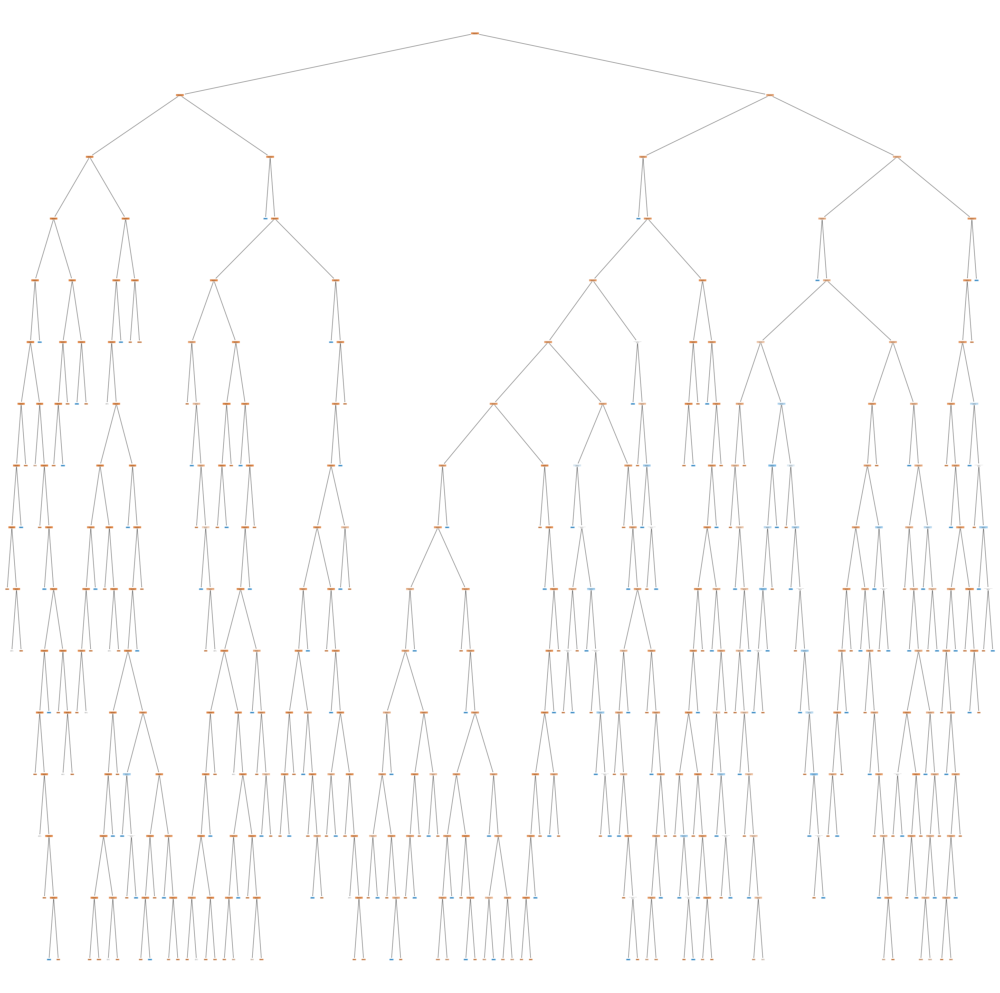

In [34]:
f = plt.figure(figsize=(50,50))
plot_tree(dectree_percRev, filled=True, rounded=True, class_names=["Won", "Not Won"], feature_names=["percentage_revenue"])

## Creating our model using multivariable

Since the relationship between our values for the movies and winning an oscar are not strongly related, we'll need to then use multiple variables to create our model. We have decided to create three seperate multivariable models to see which is best

In [35]:
multiVar = pd.DataFrame(movieDB[['runtime', 'casts_popularity_sum', 'crews_popularity_sum', 'vote_average']])
multiVar2 = pd.DataFrame(movieDB[['runtime', 'casts_popularity_sum', 'crews_popularity_sum', 'vote_average', 'percentage_revenue']])
multi = pd.DataFrame(movieDB[['runtime','vote_average','casts_popularity_sum','crews_popularity_sum','release_date']])

In [36]:
# Splitting the dataset into the Training set and Test set

won_multiVar_train, won_multiVar_test, multiVar_train, multiVar_test = train_test_split(won, multiVar, test_size = 0.2, random_state=50)
print("Multi Var Set")
print("Train Set :", won_multiVar_train.shape, multiVar_train.shape)
print("Test Set  :", won_multiVar_test.shape, multiVar_test.shape)

# Splitting the dataset into the Training set and Test set
won_multiVar2_train, won_multiVar2_test, multiVar2_train, multiVar2_test = train_test_split(won, multiVar2, test_size = 0.2, random_state=50)
print("Multi Var Set 2")
print("Train Set :", won_multiVar2_train.shape, multiVar2_train.shape)
print("Test Set  :", won_multiVar2_test.shape, multiVar2_test.shape)

multi_train,multi_test,won_multi_train,won_multi_test=train_test_split(multi,won,test_size=0.2,random_state=50)

Multi Var Set
Train Set : (7689, 1) (7689, 4)
Test Set  : (1923, 1) (1923, 4)
Multi Var Set 2
Train Set : (7689, 1) (7689, 5)
Test Set  : (1923, 1) (1923, 5)


<Axes: >

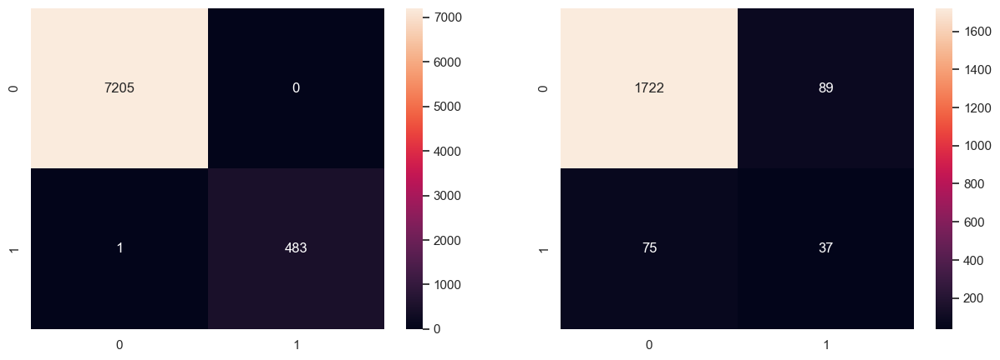

In [37]:
dtree=DecisionTreeClassifier(max_depth=20,random_state=50)
dtree.fit(multi_train,won_multi_train)
multi_train_pred=dtree.predict(multi_train)
multi_test_pred = dtree.predict(multi_test)
f, axes=plt.subplots(1,2,figsize=(15,5))
sb.heatmap(confusion_matrix(won_multi_train,multi_train_pred),annot=True,fmt='d',ax=axes[0])
sb.heatmap(confusion_matrix(won_multi_test,multi_test_pred),annot=True,fmt="d",ax=axes[1])

In [38]:
TPRTrain, FPRTrain = binary_metric(won_crewSum_train, crewSum_train_pred)
TPRTest, FPRTest = binary_metric(won_crewSum_test, crewSum_test_pred)
print("Variable: CrewSum")
print("Classification Accuracy for train data:\t", dectree_crewSum.score(crewSum_train, won_crewSum_train))
print("Classification Accuracy for test data:\t", dectree_crewSum.score(crewSum_test, won_crewSum_test))
print("TPR for train:\t", TPRTrain)
print("FPR for train:\t", FPRTrain)

print("TPR for test:\t", TPRTest)
print("FPR for train:\t", FPRTest)

Variable: CrewSum
Classification Accuracy for train data:	 0.9670958512160229
Classification Accuracy for test data:	 0.9126365054602185
TPR for train:	 0.4772727272727273
FPR for train:	 0.0
TPR for test:	 0.026785714285714284
FPR for train:	 0.03257868580894534


<Axes: >

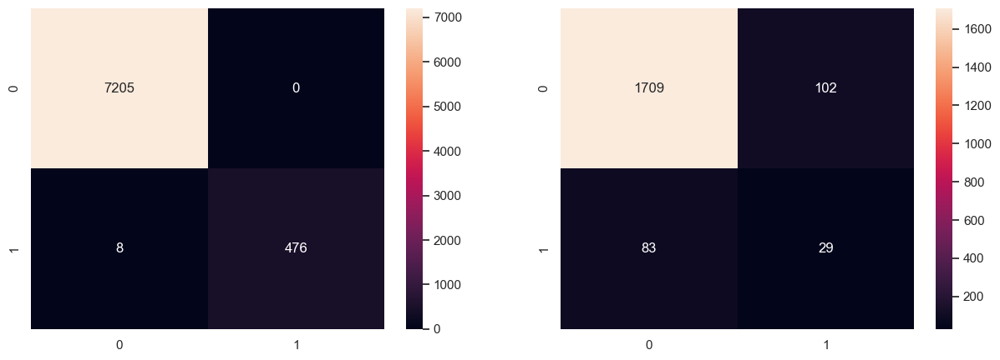

In [39]:
# Decision Tree for multiVar
dectree_multiVar = DecisionTreeClassifier(max_depth = 20, random_state=50)
dectree_multiVar.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_train_pred = dectree_multiVar.predict(multiVar_train)
multiVar_test_pred = dectree_multiVar.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_test_pred), annot = True, fmt = "d", ax = ax[1])

### Does not look really good on the test set.

[Text(0.4491156640310234, 0.9761904761904762, 'vote_average <= 7.156\ngini = 0.118\nsamples = 7689\nvalue = [7205, 484]\nclass = Won'),
 Text(0.25978083870534513, 0.9285714285714286, 'runtime <= 133.5\ngini = 0.052\nsamples = 5951\nvalue = [5791, 160]\nclass = Won'),
 Text(0.16467314665592264, 0.8809523809523809, 'vote_average <= 6.75\ngini = 0.041\nsamples = 5610\nvalue = [5493, 117]\nclass = Won'),
 Text(0.09583165457964007, 0.8333333333333334, 'runtime <= 109.5\ngini = 0.024\nsamples = 4470\nvalue = [4415, 55]\nclass = Won'),
 Text(0.058554928820843406, 0.7857142857142857, 'casts_popularity_sum <= 447.658\ngini = 0.015\nsamples = 3481\nvalue = [3455, 26]\nclass = Won'),
 Text(0.035723878592532905, 0.7380952380952381, 'vote_average <= 6.176\ngini = 0.013\nsamples = 3415\nvalue = [3393, 22]\nclass = Won'),
 Text(0.021488047273704004, 0.6904761904761905, 'casts_popularity_sum <= 61.986\ngini = 0.005\nsamples = 2170\nvalue = [2165, 5]\nclass = Won'),
 Text(0.0128928283642224, 0.64285714

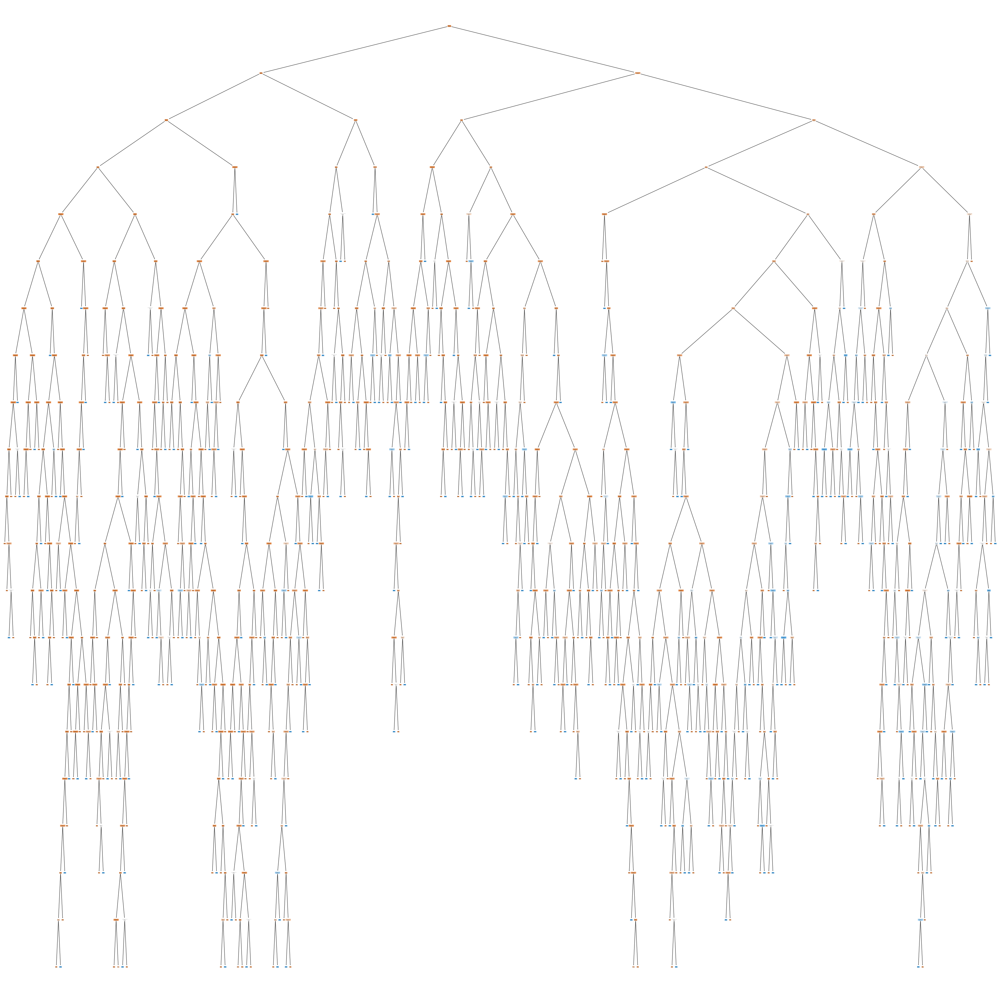

In [40]:
# Printing decision Tree
f = plt.figure(figsize=(50,50))
plot_tree(dectree_multiVar, filled = True, rounded = True, class_names = ["Won", "Not Won"], feature_names = ["runtime", "casts_popularity_sum", "crews_popularity_sum", "vote_average"])

<Axes: >

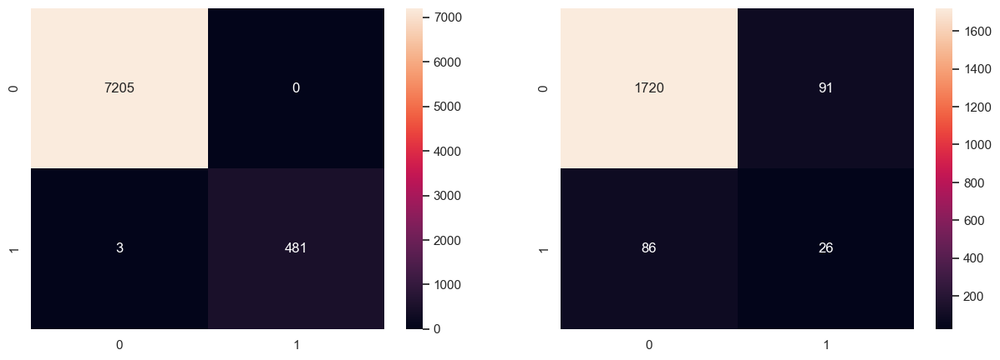

In [41]:
# Decision Tree for multiVar2
dectree_percRev = DecisionTreeClassifier(max_depth = 20, random_state=50)
dectree_percRev.fit(multiVar2_train, won_multiVar2_train)

# Predicting the Test set results
multiVar2_train_pred = dectree_percRev.predict(multiVar2_train)
multiVar2_test_pred = dectree_percRev.predict(multiVar2_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar2_train, multiVar2_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar2_test, multiVar2_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Temp\ipykernel_15796\1913432871.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(runtime_train, won_train)


<Axes: >

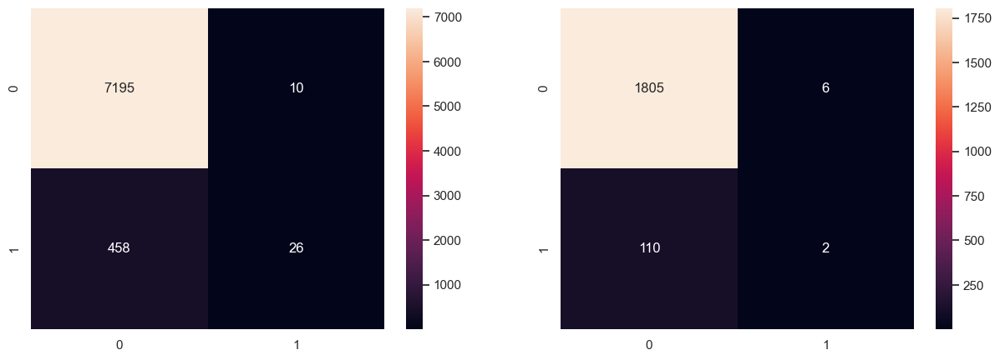

In [42]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

# Fitting Random Forest Classification to the Training set

# Based on runtime
rfc = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfc.fit(runtime_train, won_train)

# Predicting the Test set results
runtime_rfc_train_pred = rfc.predict(runtime_train)
runtime_rfc_test_pred = rfc.predict(runtime_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_train, runtime_rfc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_test, runtime_rfc_test_pred), annot = True, fmt = "d", ax = ax[1])


C:\Users\zephy\AppData\Local\Temp\ipykernel_15796\1742334883.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc2.fit(castSum_train, won_castSum_train)


<Axes: >

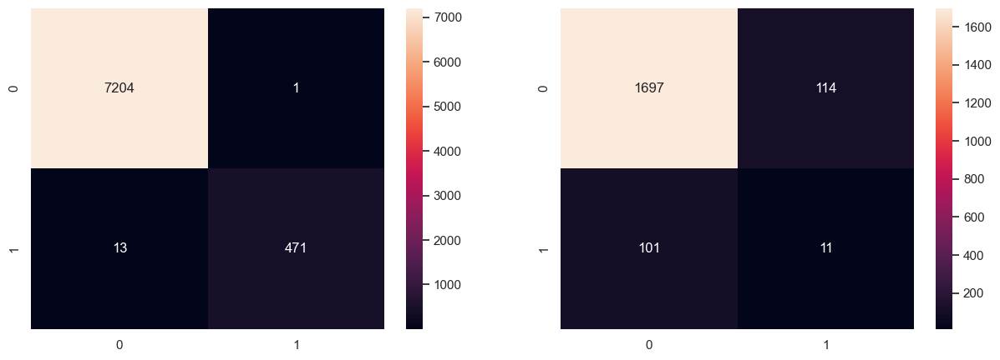

In [43]:
# Based on castSum
rfc2 = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfc2.fit(castSum_train, won_castSum_train)

# Predicting the Test set results
castSum_rfc_train_pred = rfc2.predict(castSum_train)
castSum_rfc_test_pred = rfc2.predict(castSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_castSum_train, castSum_rfc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_castSum_test, castSum_rfc_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Temp\ipykernel_15796\953478528.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc3.fit(crewSum_train, won_crewSum_train)


<Axes: >

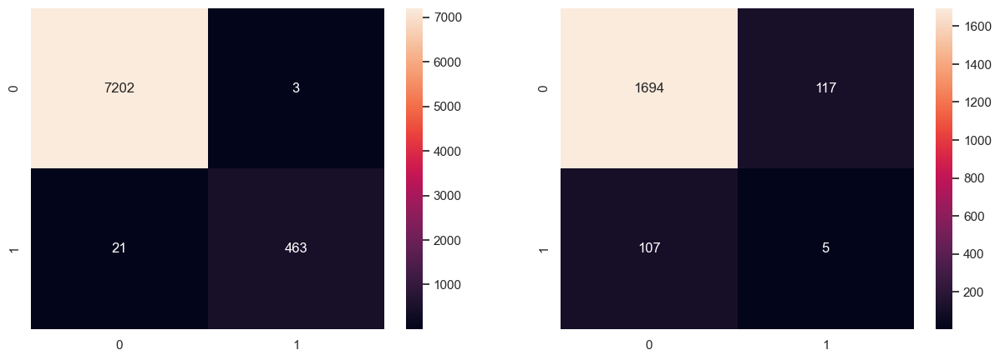

In [44]:
# Based on crewSum
rfc3 = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfc3.fit(crewSum_train, won_crewSum_train)

# Predicting the Test set results
crewSum_rfc_train_pred = rfc3.predict(crewSum_train)
crewSum_rfc_test_pred = rfc3.predict(crewSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_crewSum_train, crewSum_rfc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_crewSum_test, crewSum_rfc_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Temp\ipykernel_15796\612582694.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc4.fit(voteAvg_train, won_voteAge_train)


<Axes: >

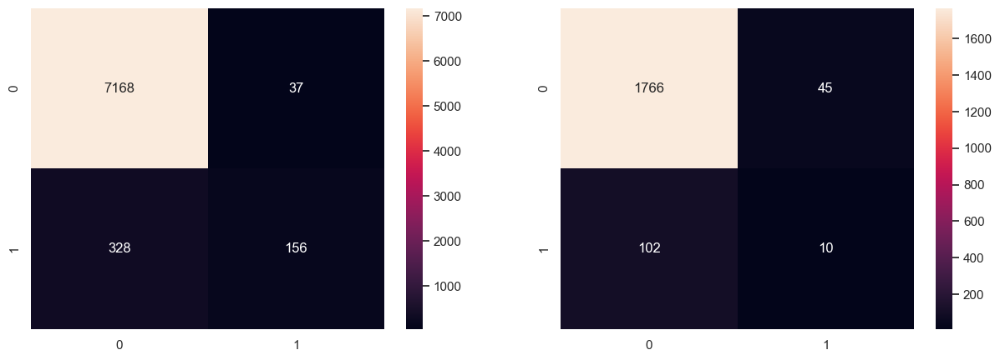

In [45]:
# Based on voteAvg
rfc4 = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfc4.fit(voteAvg_train, won_voteAge_train)

# Predicting the Test set results
voteAvg_rfc_train_pred = rfc4.predict(voteAvg_train)
voteAvg_rfc_test_pred = rfc4.predict(voteAvg_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_voteAge_train, voteAvg_rfc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_voteAge_test, voteAvg_rfc_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Temp\ipykernel_15796\3262505659.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc5.fit(multiVar_train, won_multiVar_train)


<Axes: >

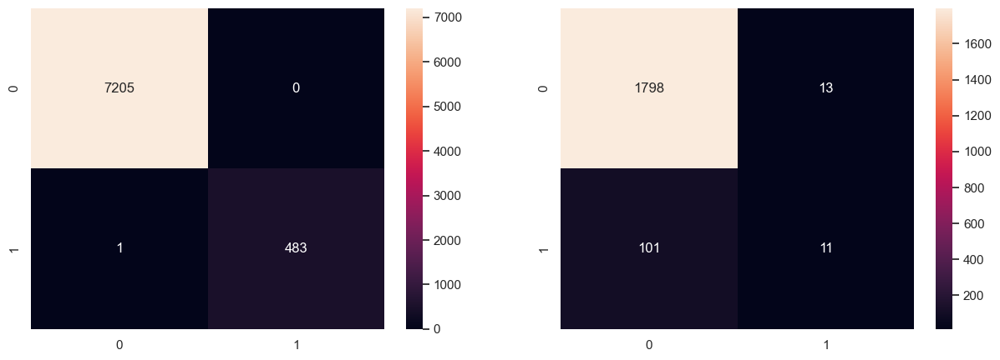

In [46]:
# Based on multiVar
rfc5 = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfc5.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_rfc_train_pred = rfc5.predict(multiVar_train)
multiVar_rfc_test_pred = rfc5.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_rfc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_rfc_test_pred), annot = True, fmt = "d", ax = ax[1])

# Okay randomForest wasn't much better

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

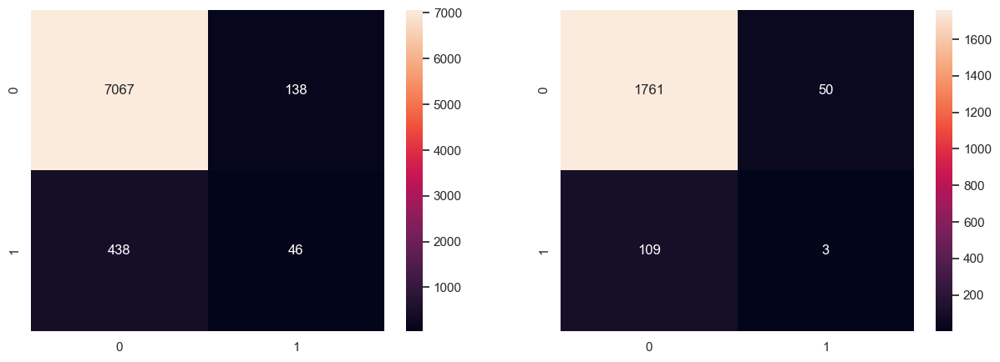

In [47]:
# KNN
from sklearn.neighbors import KNeighborsClassifier

# Fitting K-NN to the Training set

# Based on runtime
knn = KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 2)
knn.fit(runtime_train, won_train)

# Predicting the Test set results
runtime_knn_train_pred = knn.predict(runtime_train)
runtime_knn_test_pred = knn.predict(runtime_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_train, runtime_knn_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_test, runtime_knn_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

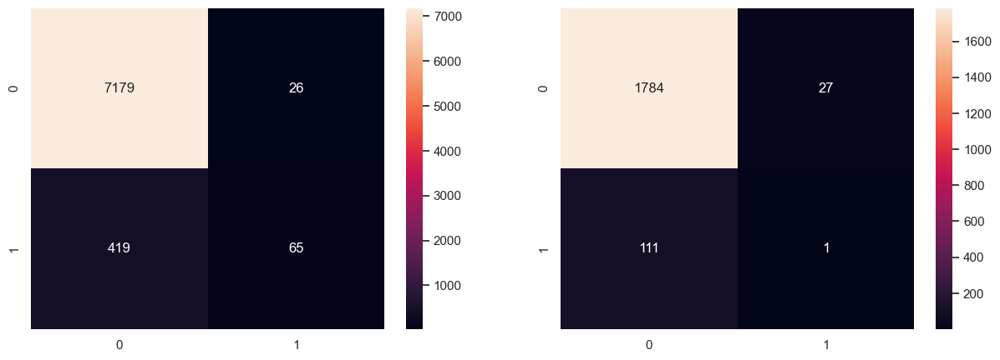

In [48]:
# Based on castSum
knn2 = KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 2)
knn2.fit(castSum_train, won_castSum_train)

# Predicting the Test set results
castSum_knn_train_pred = knn2.predict(castSum_train)
castSum_knn_test_pred = knn2.predict(castSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_castSum_train, castSum_knn_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_castSum_test, castSum_knn_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

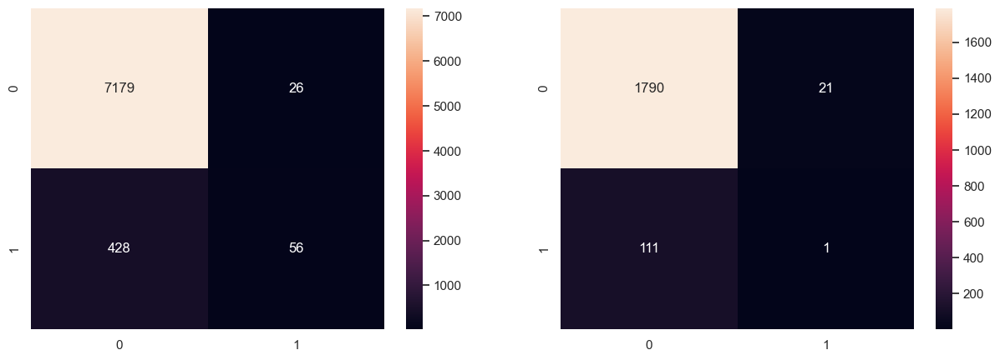

In [49]:
# Based on crewSum
knn3 = KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 2)
knn3.fit(crewSum_train, won_crewSum_train)

# Predicting the Test set results
crewSum_knn_train_pred = knn3.predict(crewSum_train)
crewSum_knn_test_pred = knn3.predict(crewSum_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_crewSum_train, crewSum_knn_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_crewSum_test, crewSum_knn_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

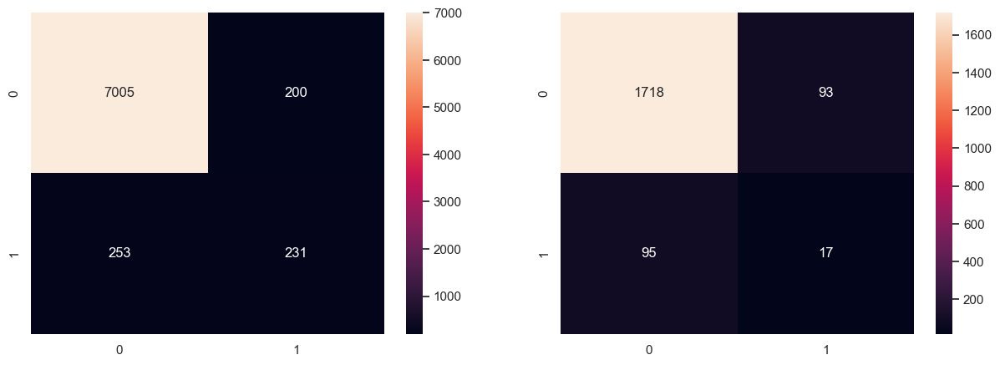

In [50]:
# Based on voteAvg
knn4 = KNeighborsClassifier(n_neighbors = 1, metric = 'minkowski', p = 2)
knn4.fit(voteAvg_train, won_voteAge_train)

# Predicting the Test set results
voteAvg_knn_train_pred = knn4.predict(voteAvg_train)
voteAvg_knn_test_pred = knn4.predict(voteAvg_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_voteAge_train, voteAvg_knn_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_voteAge_test, voteAvg_knn_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

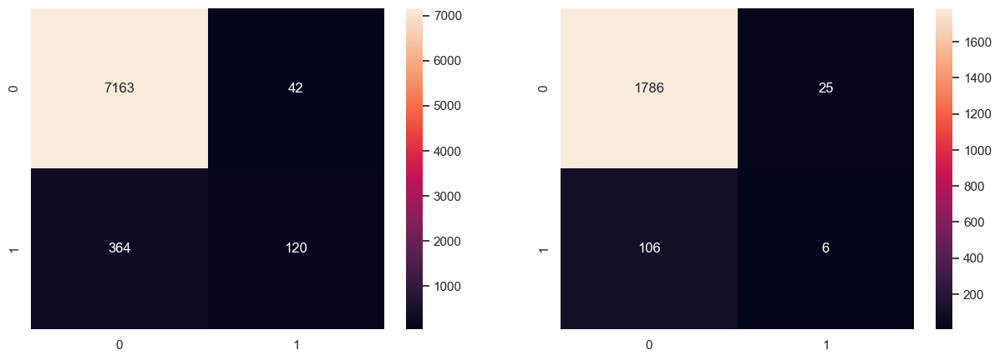

In [51]:
# Based on multiVar
knn5 = KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 5)
knn5.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_knn_train_pred = knn5.predict(multiVar_train)
multiVar_knn_test_pred = knn5.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_knn_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_knn_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<Axes: >

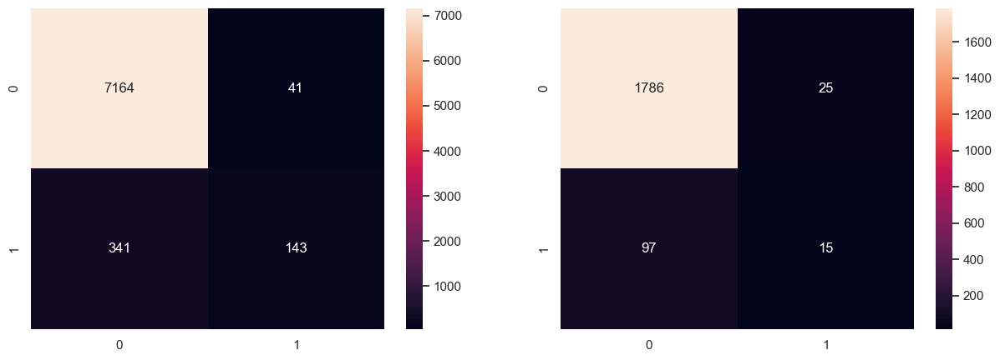

In [52]:
knn6 = KNeighborsClassifier(n_neighbors = 3,metric = 'minkowski', p = 5)
knn6.fit(multi_train,won_multi_train)
multi_knn_train_pred = knn6.predict(multi_train)
multi_knn_test_pred = knn6.predict(multi_test)
f, axes=plt.subplots(1,2,figsize=(15,5))
sb.heatmap(confusion_matrix(won_multi_train,multi_knn_train_pred),annot=True,fmt="d",ax=axes[0])
sb.heatmap(confusion_matrix(won_multi_test,multi_knn_test_pred),annot=True,fmt="d",ax=axes[1])



# KNN did not work very well either

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<Axes: >

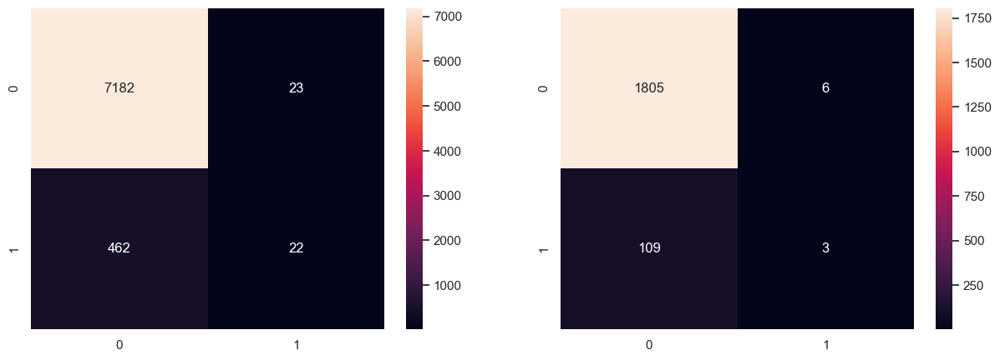

In [53]:
# Trying Logistic Regression
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression to the Training set

# Based on mutliVar
lr = LogisticRegression(random_state = 0)
lr.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_lr_train_pred = lr.predict(multiVar_train)
multiVar_lr_test_pred = lr.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_lr_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_lr_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<Axes: >

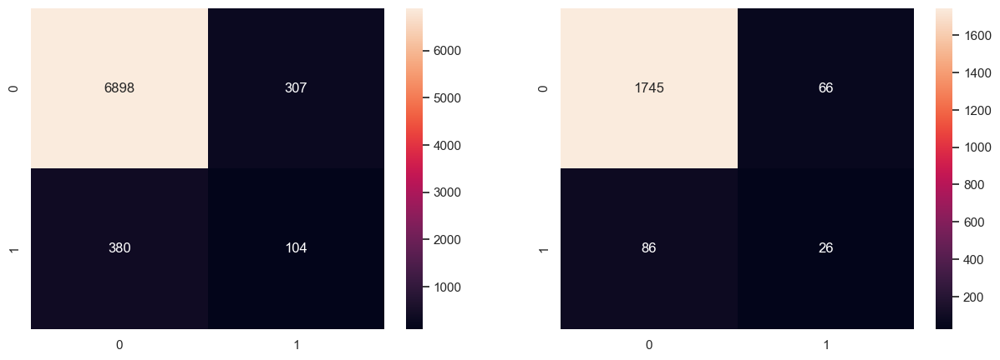

In [54]:
# Trying Naive Bayes
from sklearn.naive_bayes import GaussianNB

# Fitting Naive Bayes to the Training set

# Based on mutliVar
nb = GaussianNB()
nb.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_nb_train_pred = nb.predict(multiVar_train)
multiVar_nb_test_pred = nb.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_nb_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_nb_test_pred), annot = True, fmt = "d", ax = ax[1])

# Ran on google collab it was useless

In [55]:
# Trying SVM
from sklearn.svm import SVC

# Fitting SVM to the Training set

# Based on mutliVar
svc = SVC(kernel = 'linear', random_state = 0)
svc.fit(multiVar_train, won_multiVar_train)

# Predicting the Test set results
multiVar_svc_train_pred = svc.predict(multiVar_train)
multiVar_svc_test_pred = svc.predict(multiVar_test)

# Confusion Matrix for Train and Test Set
f, ax = plt.subplots(1, 2, figsize = (15, 5))
sb.heatmap(confusion_matrix(won_multiVar_train, multiVar_svc_train_pred), annot = True, fmt = "d", ax = ax[0])
sb.heatmap(confusion_matrix(won_multiVar_test, multiVar_svc_test_pred), annot = True, fmt = "d", ax = ax[1])

C:\Users\zephy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
